In [2]:
%%bash
pip install transformers
pip install torch

In [3]:
from PIL import Image
import matplotlib.pyplot as plt
import io
import numpy as np

In [4]:
DATASET_DIRECTORY = './DeepFashionMultimodal'


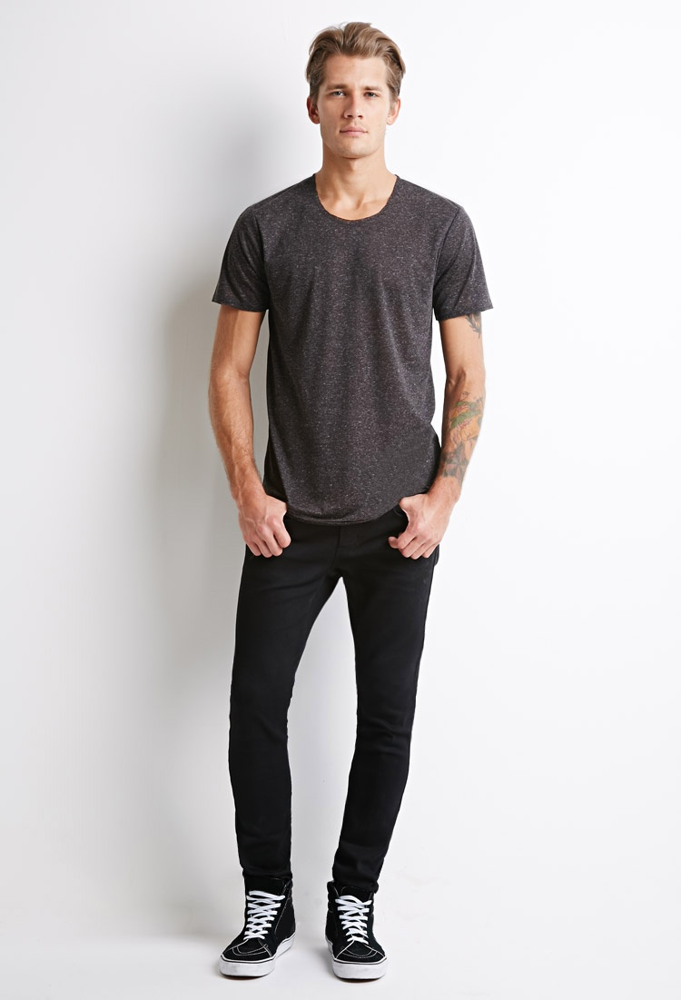

In [5]:
image = Image.open(f'{DATASET_DIRECTORY}/images/MEN-Denim-id_00000080-01_7_additional.jpg')
image



In [6]:
import json

with open(f'{DATASET_DIRECTORY}/captions.json') as f:
    captions = json.loads(f.read())

In [7]:
captions

{'MEN-Denim-id_00000080-01_7_additional.jpg': 'The lower clothing is of long length. The fabric is cotton and it has plaid patterns.',
 'MEN-Denim-id_00000089-01_7_additional.jpg': 'His tank top has sleeves cut off, cotton fabric and pure color patterns. The neckline of it is round. The pants this man wears is of long length. The pants are with cotton fabric and pure color patterns.',
 'MEN-Denim-id_00000089-02_7_additional.jpg': 'His sweater has long sleeves, cotton fabric and stripe patterns. The neckline of it is lapel. The gentleman wears a long pants. The pants are with cotton fabric and solid color patterns.',
 'MEN-Denim-id_00000089-03_7_additional.jpg': 'His shirt has short sleeves, cotton fabric and pure color patterns. It has a crew neckline. The person wears a long pants. The pants are with cotton fabric and solid color patterns.',
 'MEN-Denim-id_00000089-04_7_additional.jpg': 'The sweater the person wears has long sleeves, its fabric is denim, and it has solid color pattern

In [8]:
filenames = list(filter(lambda x : x.startswith('MEN'), captions.keys()))
filenames[:5]

['MEN-Denim-id_00000080-01_7_additional.jpg',
 'MEN-Denim-id_00000089-01_7_additional.jpg',
 'MEN-Denim-id_00000089-02_7_additional.jpg',
 'MEN-Denim-id_00000089-03_7_additional.jpg',
 'MEN-Denim-id_00000089-04_7_additional.jpg']

In [41]:
images = np.random.choice(filenames, replace=False, size=50)

In [42]:
len(images)

50

In [43]:
images_ = []
filepath = 'DeepFashionMultimodal/images/{0}'

In [44]:
for image_file in images:
    img = Image.open(filepath.format(image_file))
    images_.append(img)

In [45]:
texts = [captions[image] for image in images]

In [46]:
texts

['The T-shirt the gentleman wears has short sleeves and its fabric is cotton. The pattern of it is stripe. It has a crew neckline. There is an accessory on his wrist.',
 'The upper clothing has long sleeves, cotton fabric and color block patterns.',
 'This person is wearing a short-sleeve shirt with pure color patterns. The shirt is with cotton fabric. The neckline of the shirt is crew. There is an accessory on his wrist.',
 'His T-shirt has short sleeves, cotton fabric and graphic patterns. It has a crew neckline.',
 'This gentleman is wearing a short-sleeve shirt with color block patterns. The shirt is with cotton fabric. It has a crew neckline. This gentleman wears a short pants. The pants are with denim fabric and solid color patterns. This person is wearing socks in shoes. This gentleman is wearing a hat.',
 'His T-shirt has short sleeves, cotton fabric and graphic patterns. It has a crew neckline. This person is wearing a hat. There is an accessory on his wrist.',
 'The guy wears

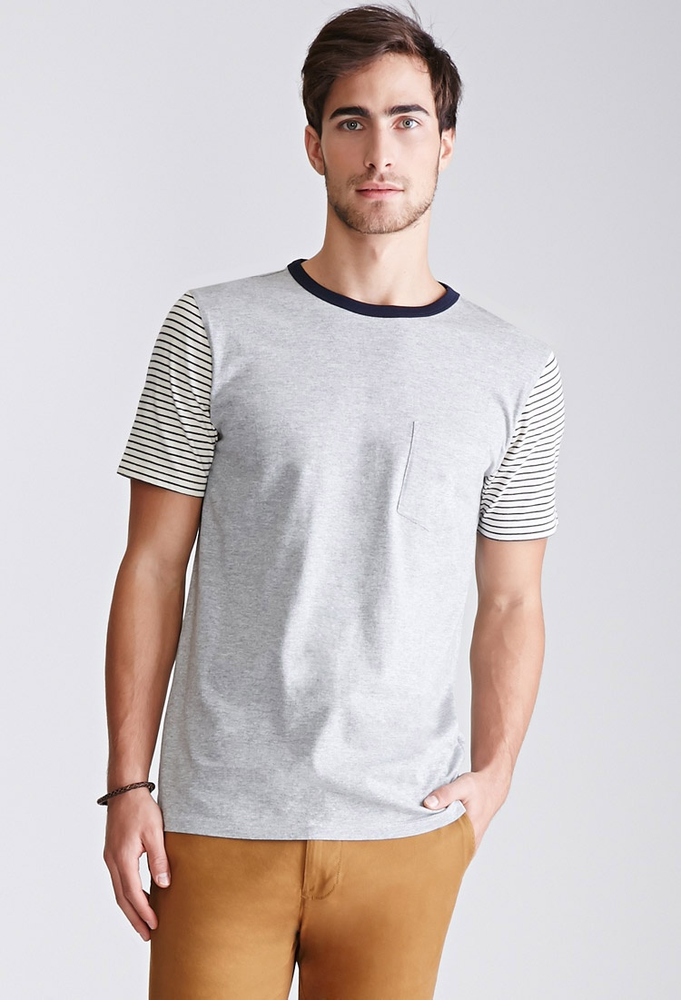

In [47]:
images_[0]

In [48]:
from src.SwagGAN.models.clip import CLIPModel

In [49]:
model = CLIPModel()

In [50]:
import torch

In [51]:
model.load_state_dict(torch.load('clip_model_epoch5.pt', map_location=torch.device('cpu')))

<All keys matched successfully>

In [52]:
text_embeds, image_embeds = model(texts, images_)

In [53]:
from sklearn.manifold import TSNE

In [54]:
embeddings = np.concatenate((text_embeds.detach().numpy(), image_embeds.detach().numpy()), axis=0)
embeddings.shape

(100, 512)

In [55]:
embeds_ = TSNE(n_components=2).fit_transform(embeddings)

/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [56]:
embeds_.shape

(100, 2)

In [57]:
embeds_[:,0].shape

(100,)

In [58]:
from matplotlib.image import BboxImage
from matplotlib.transforms import Bbox, TransformedBbox

In [59]:
# Plots an image at each x and y location. 
def plotImage(ax, x, y, im):
    bb = Bbox.from_bounds(x,y,1,1)  
    bb2 = TransformedBbox(bb,ax.transData)
    bbox_image = BboxImage(bb2,
                        norm = None,
                        origin=None,
                        clip_on=False)

    bbox_image.set_data(im)
    ax.add_artist(bbox_image)

In [60]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111)

for i in range(15):
    plotImage(ax, embeds_[50 + i][0], embeds_[50 + i][1], images_[i])

plt.show()

In [61]:
import torch.nn as nn
import torch
import torch.nn.functional as F

In [62]:
text_embeds, image_embeds = F.normalize(text_embeds, dim=1), F.normalize(image_embeds, dim=1)

In [63]:
text_embeds.size()

torch.Size([50, 512])

In [64]:
image_embeds.size()

torch.Size([50, 512])

In [65]:
cosine_similarities = text_embeds @ image_embeds.T # Dot product between all vectors

In [66]:
cosine_similarities.size()

torch.Size([50, 50])

In [67]:
cos_sims_sub = cosine_similarities[:10,:10]
cos_sims_sub.size()

torch.Size([10, 10])

In [68]:
import seaborn as sns
from textwrap import wrap

In [69]:
ylabels = ['\n'.join(wrap(text, 90)) for text in texts[:10]]

In [70]:
ylabels

['The T-shirt the gentleman wears has short sleeves and its fabric is cotton. The pattern of\nit is stripe. It has a crew neckline. There is an accessory on his wrist.',
 'The upper clothing has long sleeves, cotton fabric and color block patterns.',
 'This person is wearing a short-sleeve shirt with pure color patterns. The shirt is with\ncotton fabric. The neckline of the shirt is crew. There is an accessory on his wrist.',
 'His T-shirt has short sleeves, cotton fabric and graphic patterns. It has a crew neckline.',
 'This gentleman is wearing a short-sleeve shirt with color block patterns. The shirt is\nwith cotton fabric. It has a crew neckline. This gentleman wears a short pants. The pants\nare with denim fabric and solid color patterns. This person is wearing socks in shoes.\nThis gentleman is wearing a hat.',
 'His T-shirt has short sleeves, cotton fabric and graphic patterns. It has a crew neckline.\nThis person is wearing a hat. There is an accessory on his wrist.',
 'The guy

In [71]:
from matplotlib.image import BboxImage,imread
from matplotlib.transforms import Bbox
from matplotlib.offsetbox import (DrawingArea, OffsetImage,AnnotationBbox)

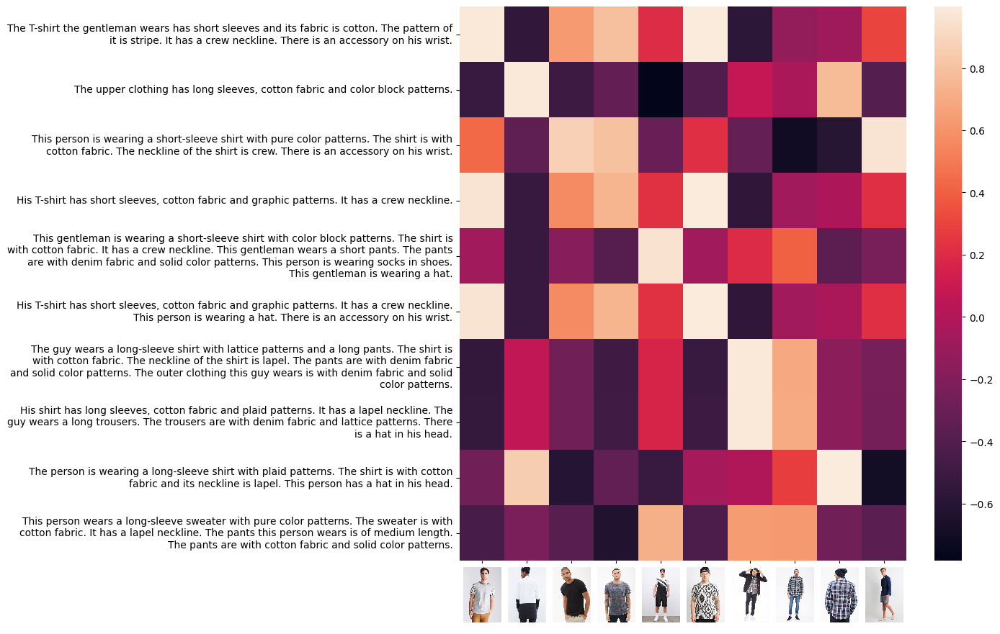

In [72]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.heatmap(cos_sims_sub.detach().numpy(), yticklabels=ylabels, ax=ax)


bboxes = [l.get_window_extent() for l in ax.get_xticklabels()]
ax.get_xaxis().set_ticklabels([])

for i, bbox in enumerate(bboxes):
    imagebox = OffsetImage(images_[i], zoom=0.05)
    imagebox.image.axes = ax

    ab = AnnotationBbox(imagebox, (i,0),
                        xybox=(0, -7),
                        xycoords=("data", "axes fraction"),
                        boxcoords="offset points",
                        box_alignment=(-0.1, 1),
                        bboxprops={"edgecolor" : "none"})

    ax.add_artist(ab)


plt.show()